# setup

In [9]:
import torch
import clip
from PIL import Image

import os
import skimage
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

from sklearn.cluster import KMeans
from scipy.spatial.distance import squareform, pdist

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

# data

In [3]:
name = 'astronaut'

filename = name + '.png'
descriptions = {
    "page": "a page of text about segmentation",
    "chelsea": "a facial photo of a tabby cat",
    "astronaut": "a portrait of an astronaut with the American flag",
    "rocket": "a rocket standing on a launchpad",
    "motorcycle_right": "a red motorcycle standing in a garage",
    "camera": "a person looking at a camera on a tripod",
    "horse": "a black-and-white silhouette of a horse", 
    "coffee": "a cup of coffee on a saucer"
}

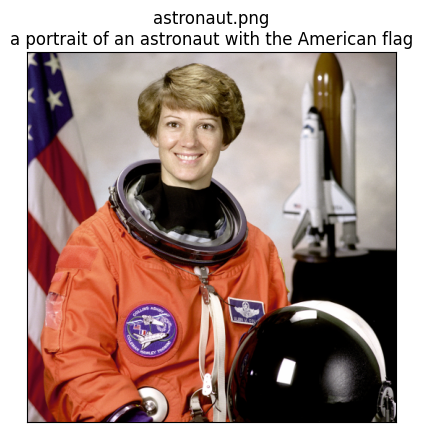

In [4]:
rgb_image = Image.open(os.path.join(skimage.data_dir, filename)).convert("RGB")
plt.imshow(rgb_image);
plt.title(f"{filename}\n{descriptions[name]}");
plt.xticks([]);
plt.yticks([]);

# model

In [5]:
# model, preprocess = clip.load("ViT-B/32", device = device)
model, preprocess = clip.load("RN50", device = device)

In [6]:
image = preprocess(Image.open(os.path.join(skimage.data_dir, filename))).unsqueeze(0).to(device)
text = clip.tokenize([descriptions[name]]).to(device)

In [39]:
with torch.no_grad():
    image_features = model.encode_image(image).cpu()

In [83]:
_, significante = np.where(np.abs(image_features) > 0.2)
significante

array([  29,   92,  101,  144,  170,  202,  216,  222,  256,  269,  273,
        300,  333,  361,  452,  466,  475,  512,  521,  526,  575,  601,
        607,  749,  834,  891,  895,  905,  907,  913,  974,  978, 1012,
       1023])

# kmenas

In [46]:
target_layers = [model.visual.layer4]
cam = GradCAM(model = model.visual, target_layers = target_layers)

In [47]:
cam(input_tensor = image, targets = [ClassifierOutputTarget(i)]).shape

(1, 224, 224)

In [ ]:
for i in tqdm((significante)):
    grayscale_cam = cam(input_tensor = image, targets = [ClassifierOutputTarget(i)])

    fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (10, 4))
    fig.suptitle(f"h{i}\n{descriptions[name]}")
    ax[0].imshow(rgb_image);
    ax[0].set_xticks([]);
    ax[0].set_yticks([]);

    ax[1].imshow(grayscale_cam[0, :, :]);
    ax[1].set_xticks([]);
    ax[1].set_yticks([]);

In [12]:
# D = np.zeros(shape = (1024, 224 * 224))
# for i in tqdm(range(1024)):
#     d = cam(input_tensor = image, targets = [ClassifierOutputTarget(i)]).reshape(-1)
#     D[i, :] = d

100%|██████████| 1024/1024 [00:29<00:00, 34.73it/s]


In [123]:
D = np.zeros(shape = (len(significante), 224 * 224))
for ii, i in tqdm(enumerate(significante)):
    d = cam(input_tensor = image, targets = [ClassifierOutputTarget(i)]).reshape(-1)
    if (d == 0).all():
        d += 1e-6 * np.random.rand(d.shape[0])
    D[ii, :] = d

34it [00:01, 30.60it/s]


In [124]:
spatial_distances = pdist(D, metric = 'correlation')

In [125]:
spatial_distance_matrix = squareform(spatial_distances)

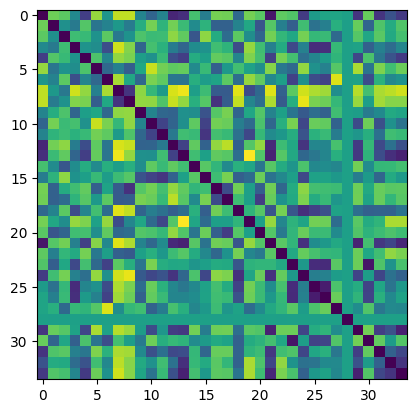

In [126]:
plt.imshow(spatial_distance_matrix);

In [128]:
spatial_distance_matrix[np.isnan(spatial_distance_matrix)] = 1e6

In [129]:
k = 4
kmeans = KMeans(n_clusters = k, n_init = 'auto').fit(spatial_distance_matrix)
clusters = kmeans.labels_

In [130]:
np.unique(clusters, return_counts = True)

(array([0, 1, 2, 3], dtype=int32), array([14,  8,  7,  5]))

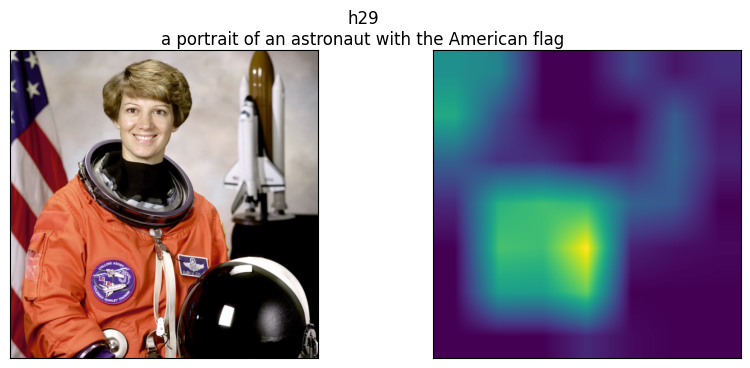

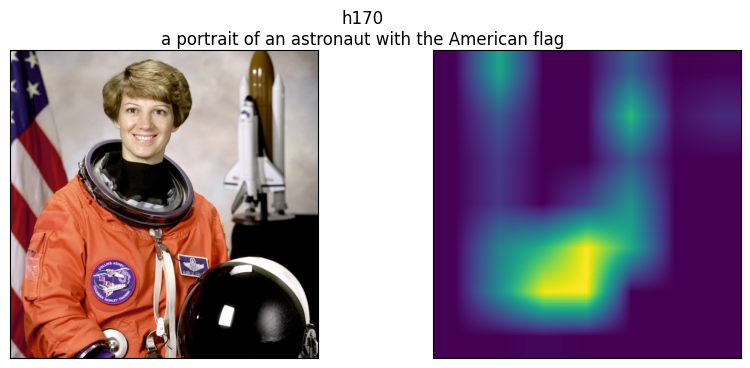

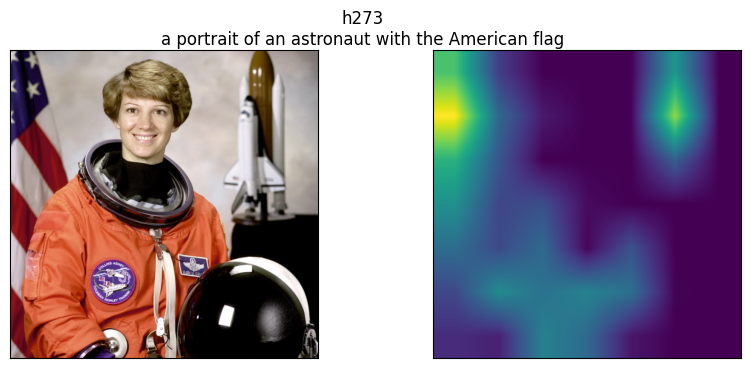

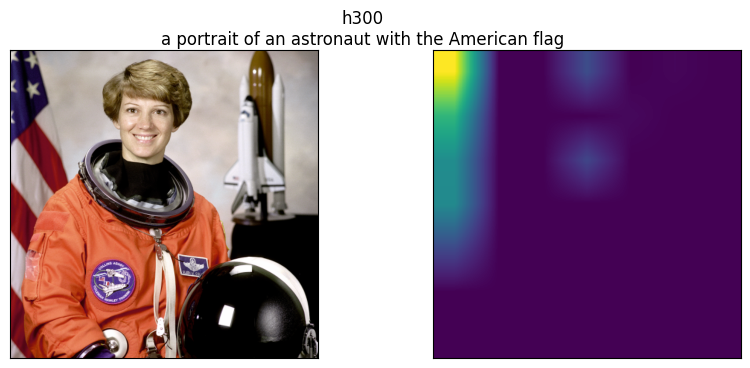

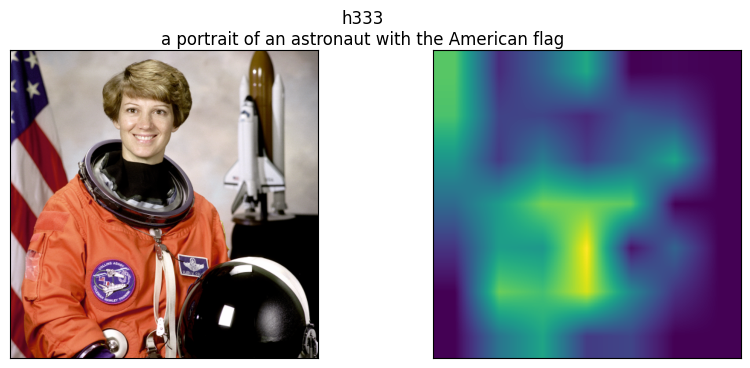

...

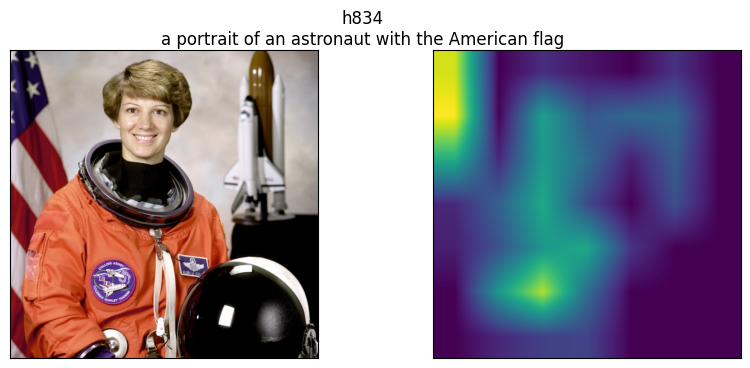

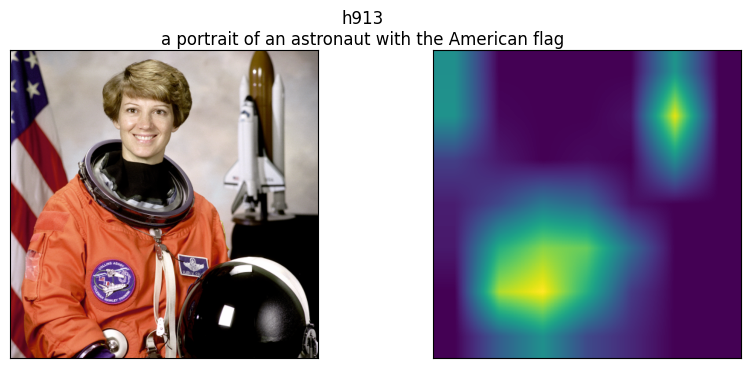

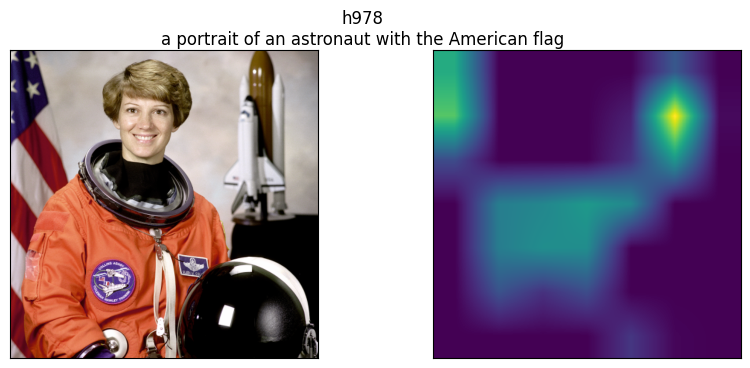

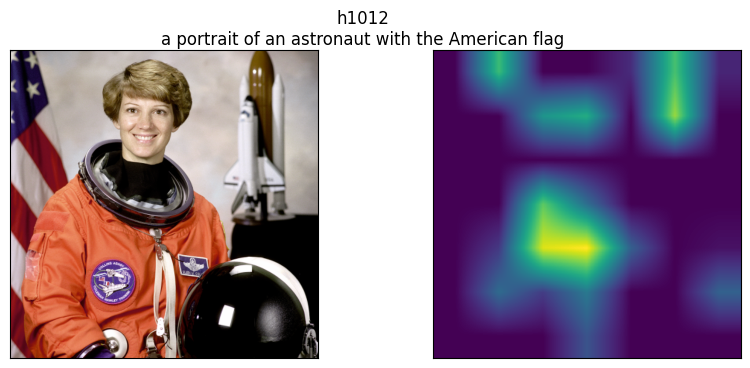

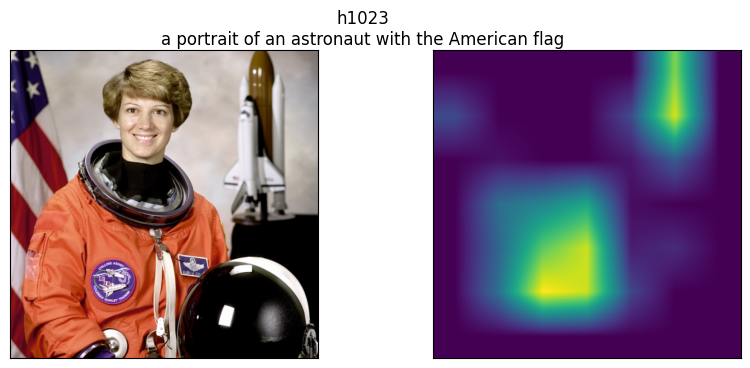

In [141]:
contador = 0
alvo = 0

for ii, i in enumerate(significante):
    if clusters[ii] == alvo:
        grayscale_cam = cam(input_tensor = image, targets = [ClassifierOutputTarget(i)])

        fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (10, 4))
        fig.suptitle(f"h{i}\n{descriptions[name]}")
        ax[0].imshow(rgb_image);
        ax[0].set_xticks([]);
        ax[0].set_yticks([]);

        ax[1].imshow(grayscale_cam[0, :, :]);
        ax[1].set_xticks([]);
        ax[1].set_yticks([]);

        contador += 1

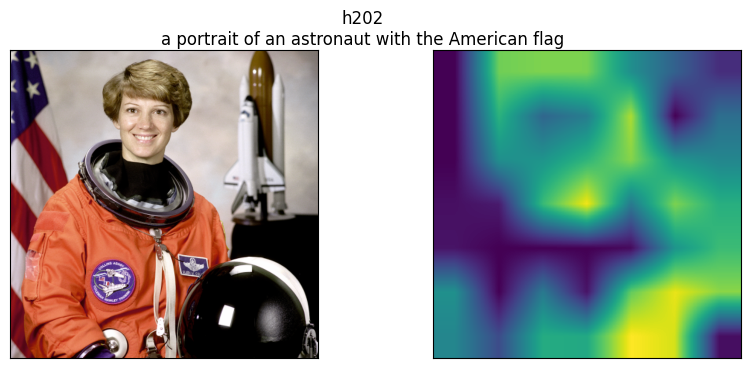

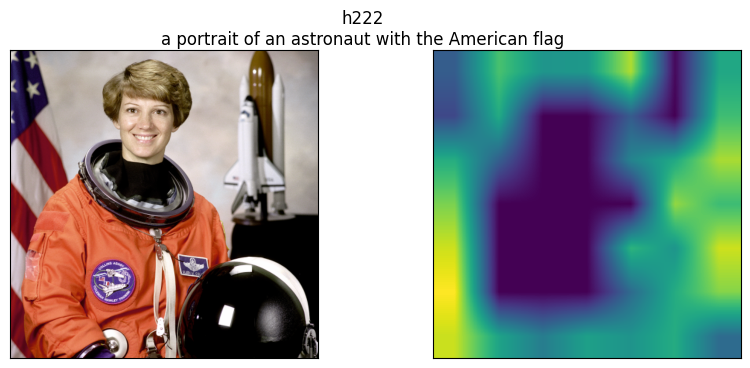

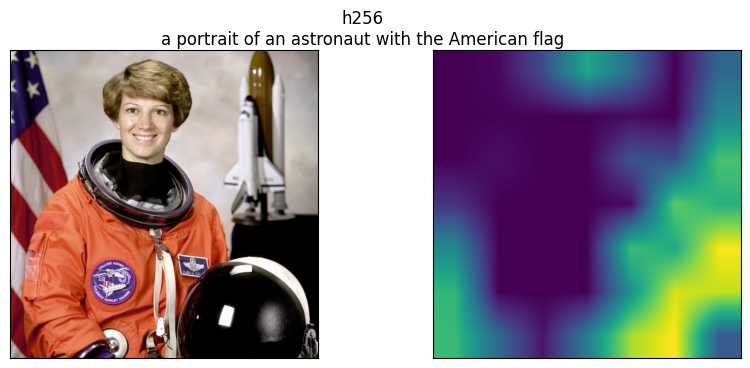

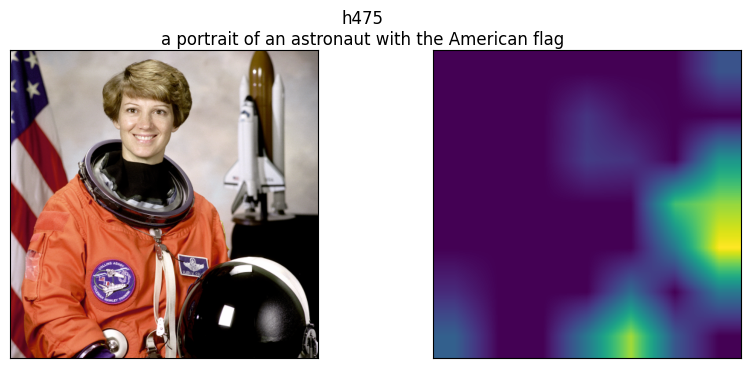

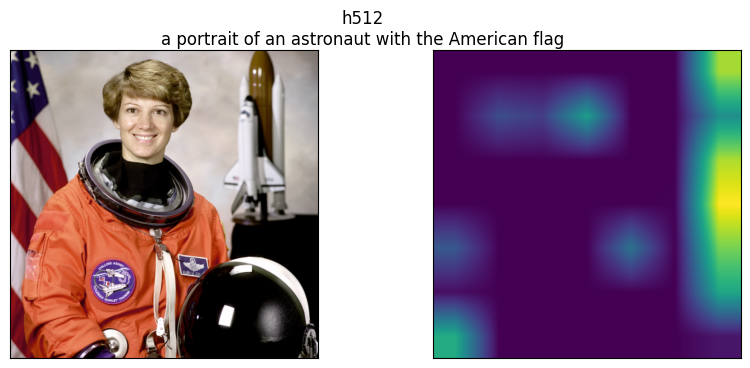

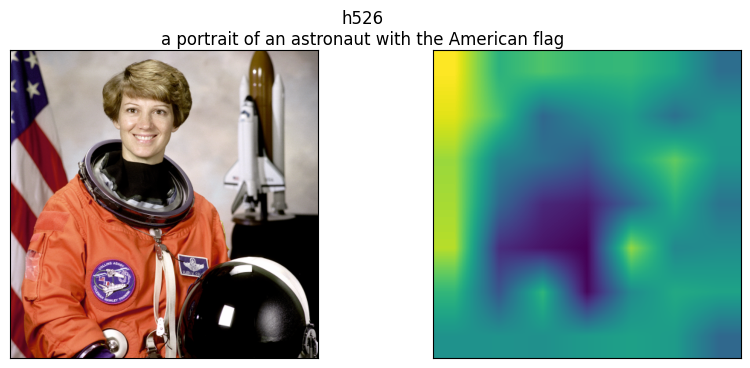

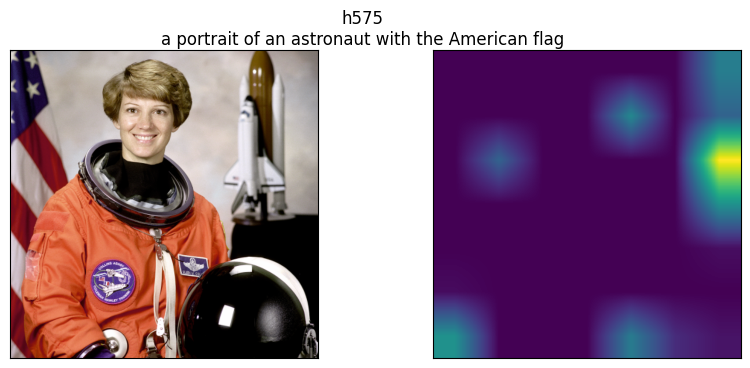

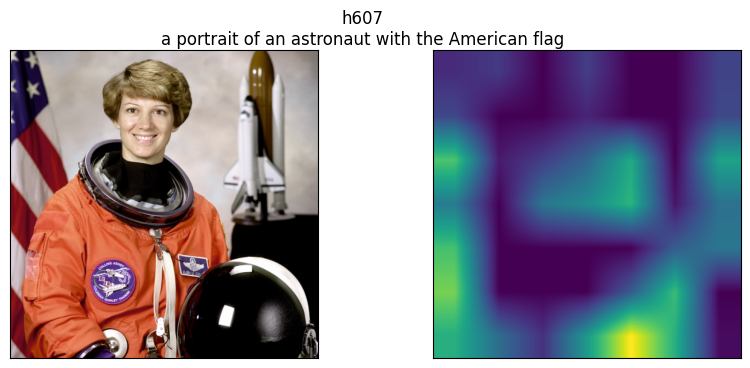

In [140]:
contador = 0
alvo = 1

for ii, i in enumerate(significante):
    if clusters[ii] == alvo:
        grayscale_cam = cam(input_tensor = image, targets = [ClassifierOutputTarget(i)])

        fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (10, 4))
        fig.suptitle(f"h{i}\n{descriptions[name]}")
        ax[0].imshow(rgb_image);
        ax[0].set_xticks([]);
        ax[0].set_yticks([]);

        ax[1].imshow(grayscale_cam[0, :, :]);
        ax[1].set_xticks([]);
        ax[1].set_yticks([]);

        contador += 1

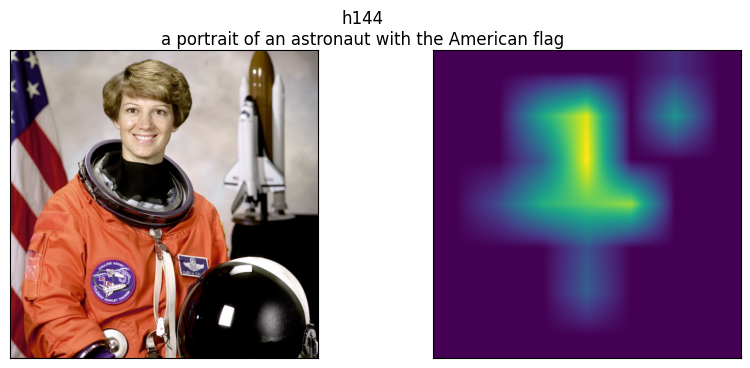

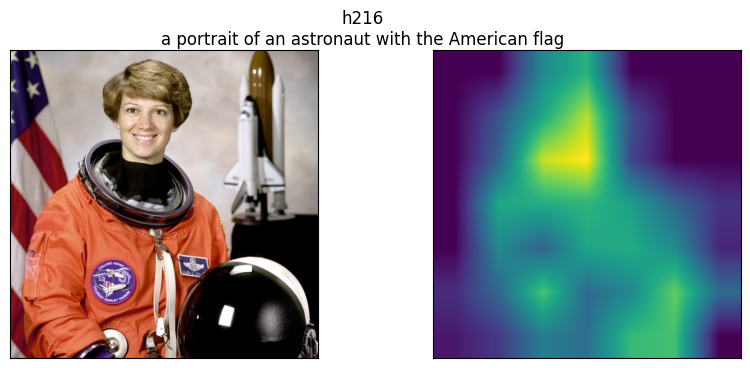

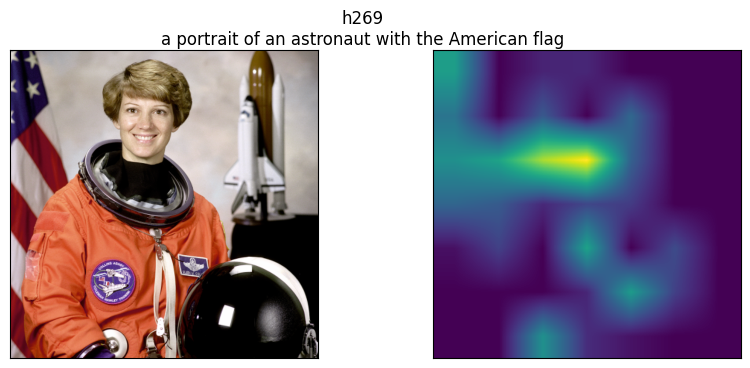

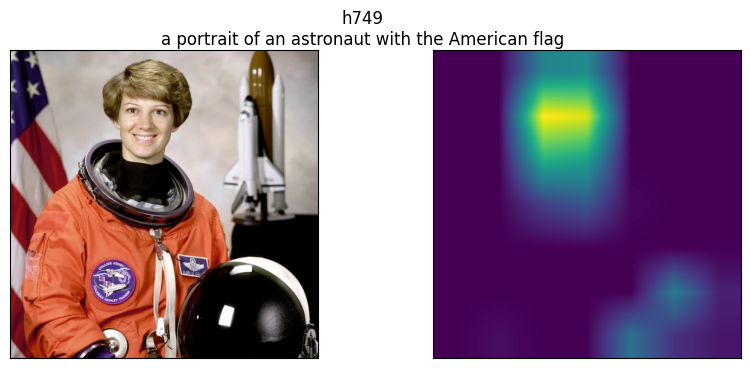

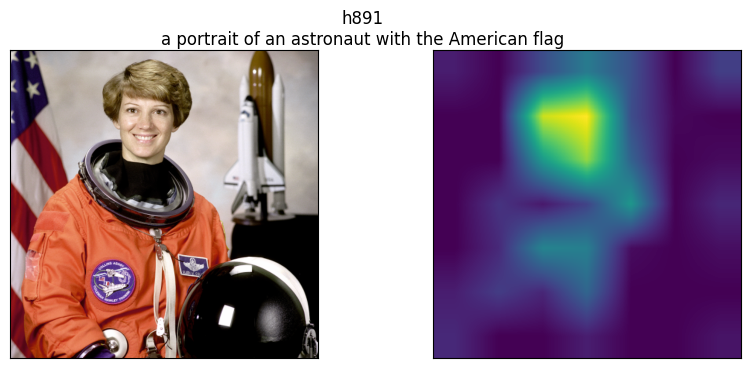

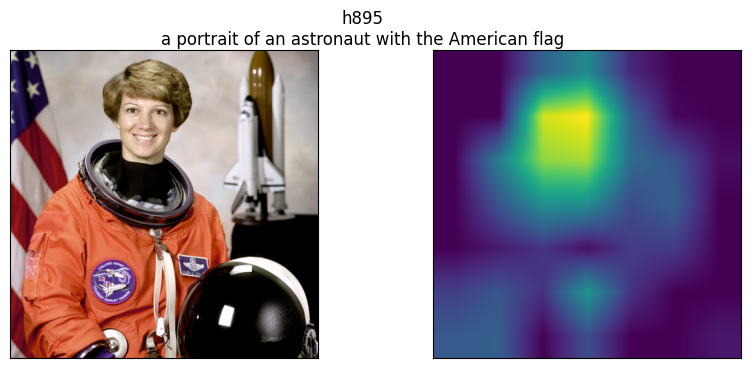

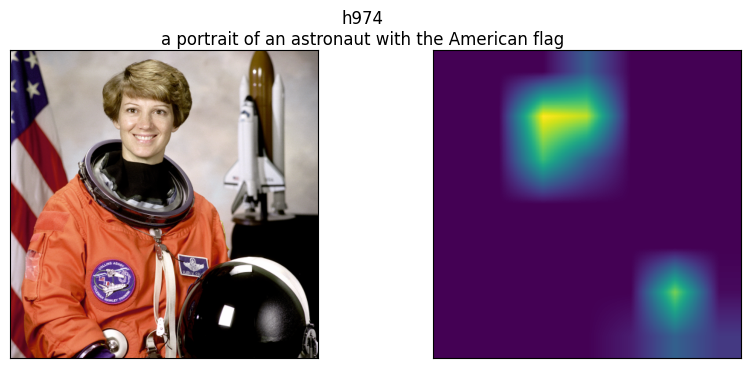

In [139]:
contador = 0
alvo = 2

for ii, i in enumerate(significante):
    if clusters[ii] == alvo:
        grayscale_cam = cam(input_tensor = image, targets = [ClassifierOutputTarget(i)])

        fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (10, 4))
        fig.suptitle(f"h{i}\n{descriptions[name]}")
        ax[0].imshow(rgb_image);
        ax[0].set_xticks([]);
        ax[0].set_yticks([]);

        ax[1].imshow(grayscale_cam[0, :, :]);
        ax[1].set_xticks([]);
        ax[1].set_yticks([]);

        contador += 1

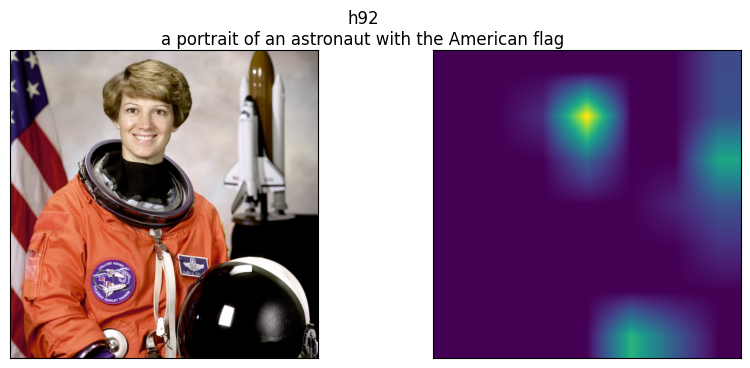

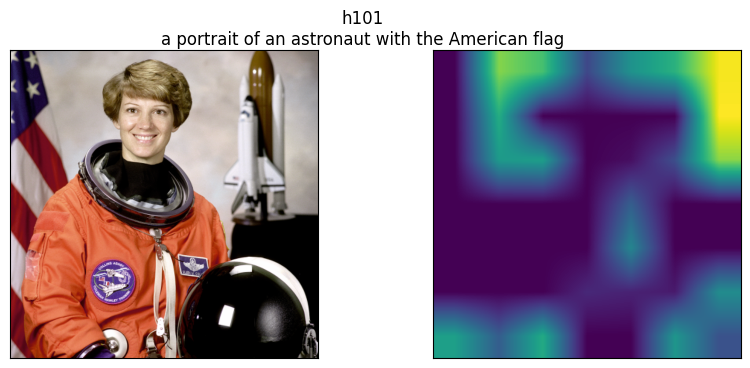

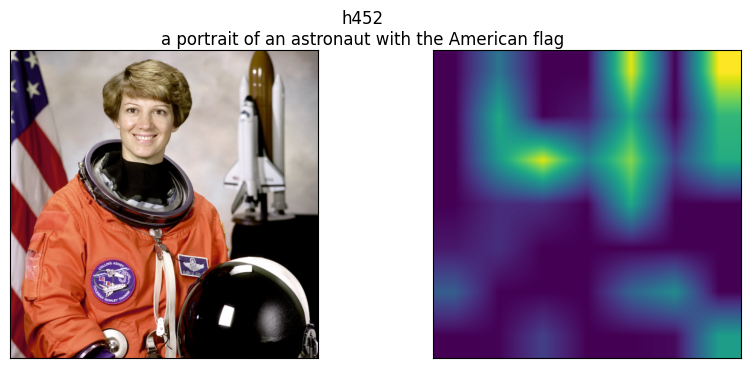

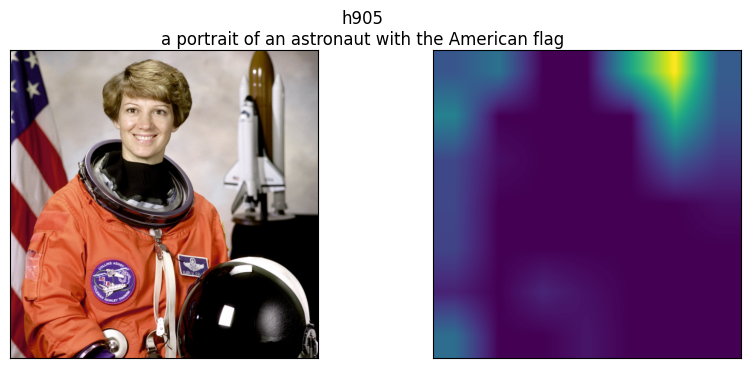

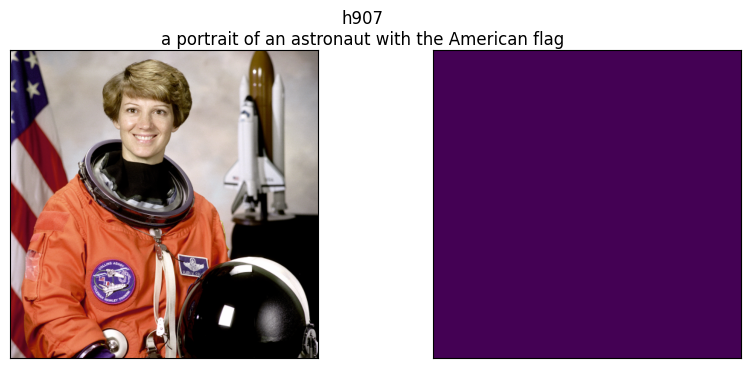

In [138]:
contador = 0
alvo = 3

for ii, i in enumerate(significante):
    if clusters[ii] == alvo:
        grayscale_cam = cam(input_tensor = image, targets = [ClassifierOutputTarget(i)])

        fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (10, 4))
        fig.suptitle(f"h{i}\n{descriptions[name]}")
        ax[0].imshow(rgb_image);
        ax[0].set_xticks([]);
        ax[0].set_yticks([]);

        ax[1].imshow(grayscale_cam[0, :, :]);
        ax[1].set_xticks([]);
        ax[1].set_yticks([]);

        contador += 1

In [ ]:
# contador = 0
# alvo = 0

# for i in range(1024):
#     if clusters[i] == alvo:
#         grayscale_cam = cam(input_tensor = image, targets = [ClassifierOutputTarget(i)])

#         fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (10, 4))
#         fig.suptitle(f"h{i}\n{descriptions[name]}")
#         ax[0].imshow(rgb_image);
#         ax[0].set_xticks([]);
#         ax[0].set_yticks([]);

#         ax[1].imshow(grayscale_cam[0, :, :]);
#         ax[1].set_xticks([]);
#         ax[1].set_yticks([]);

#         contador += 1
#         if contador > 5:
#             break